In [1]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.dates as mdates
import geopy
import haversine as hs
import matplotlib as mpl

from shapely.geometry.polygon import Polygon
from shapely.geometry.multipolygon import MultiPolygon
from shapely.affinity import affine_transform
from matplotlib.patches import Rectangle

In [2]:
def load_dataset(q, delta=7, omega=28, base_folder="../outputs/TE_cnig_provincias"):
    experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
    exp_folder = os.path.join(base_folder, experiment)
    results_fname = os.path.join(exp_folder, "TE.nc")
    return xr.load_dataset(results_fname)

def heatmap_global_TE(data, title="", cmap='bwr'):
    
    fig, ax = plt.subplots(1, 1, figsize=(18,12), sharex=True, dpi=200)
    ax.set_title(title)
    
    g = sns.heatmap(data, cmap=cmap, linewidths=.01, linecolor='grey', cbar_kws={'shrink': 0.6}, ax=ax)
    _ = g.set_yticklabels(g.get_yticklabels(), rotation = 0)
    _ = g.set_xticklabels(g.get_xticklabels(), rotation = 75)
    
    fig.tight_layout()
    return fig

In [3]:
sns.set_theme('paper')
sns.set_style('ticks')

In [4]:
fig_folder = "../outputs/TE_cnig_provincias/figures"
tab_folder = "../outputs/TE_cnig_provincias/tables/"

base_folder = "../outputs/TE_cnig_provincias/"
cases_fname = os.path.join(base_folder, "cases_pop_ds.nc")
risk_ij_fname = os.path.join(base_folder, "risk_ds.nc")

cases_ds = xr.load_dataset(cases_fname)
risk_ds = xr.load_dataset(risk_ij_fname)

risk_ij_da = risk_ds['risk_ij']
trips_ij_da = risk_ds['trips_ij']

dt_risk_ij_da = risk_ij_da.diff('date')
dt_trips_ij_da = trips_ij_da.diff('date')

cases_by_100k_da = cases_ds['new_cases_by_100k']
dt_cases_by_100k_da = cases_by_100k_da.diff('date')

dates = dt_risk_ij_da.coords['date'].values

df_pro = pd.read_parquet('../data/cnig_provincias.parquet').sort_index()
df_pro = df_pro.drop(['51', '52'])
pro_names = df_pro['pro_name'].values

gdf = gpd.read_file('../data/cnig_provincias.geojson').set_index('id')
gdf = gdf.drop(['51', '52']).sort_index()

for i in gdf.index:
    gdf.loc[i, 'centroid'] = gdf.loc[i, 'geometry'].centroid

xoff = 5;  yoff = 7
matrix = [1, 0, 0, 1, xoff, yoff]
canary_islands = ["38", "35"]
for i in canary_islands:
    geom = gdf.loc[i, 'geometry']
    gdf.at[i, 'geometry'] = affine_transform(geom, matrix)
    centroid = gdf.loc[i, 'centroid']
    gdf.at[i, 'centroid'] = affine_transform(centroid, matrix)

In [5]:
omega = 28
delta = 7
q = 1

experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
exp_folder = os.path.join(base_folder, experiment)

X_fname = os.path.join(exp_folder, "X.nc")
X_ij = xr.load_dataarray(X_fname)

Y_fname = os.path.join(exp_folder, "Y.nc")
Y_j = xr.load_dataarray(Y_fname)

TE_ds = load_dataset(q=q, delta=delta, omega=omega, base_folder=base_folder)
TE_dates = TE_ds.coords['date'].values[130:]


In [130]:
omega = 28
delta = 7

i = '49'; j = '47'
i = '18'; j = '04'
i = '07'; j = '08'

i_name = df_pro.loc[i, 'pro_name']
j_name = df_pro.loc[j, 'pro_name']

var = "TE_dynamic"
argmax_idx = int(TE_ds[var].loc[i, j, TE_dates].argmax('date'))  

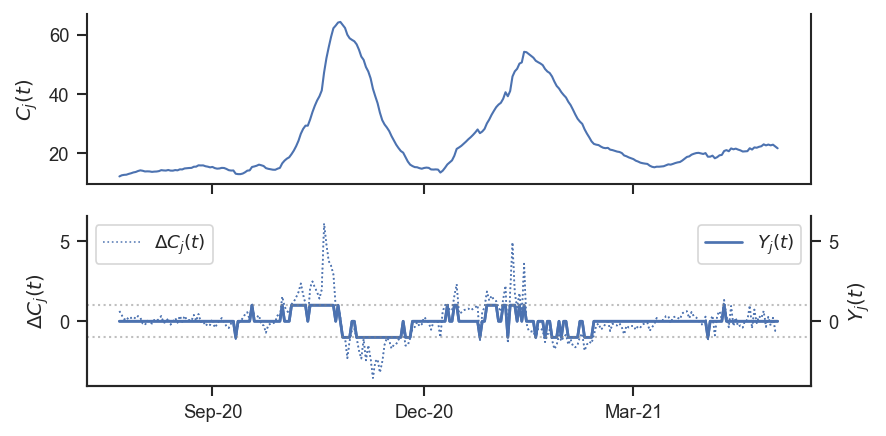

In [7]:
lw = 1.5
lw_dt = 0.8
fig, axes = plt.subplots(2, 1, figsize=(6, 3), sharex=True, dpi=150)

ax = axes[0]
ax.plot(cases_by_100k_da.loc[j, TE_dates].to_pandas(), label=rf"C[{j}](t)", c='b', lw=1)
ax.set_ylabel(r"$C_{j}(t)$")

ax = axes[1]
ax.plot(dt_cases_by_100k_da.loc[j, TE_dates].to_pandas(), c='b', lw=lw_dt, alpha=0.9, linestyle='dotted', label=r"$\Delta C_{j}(t)$")
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, lw=1.3, c='b')
ax.set_ylabel(r"$\Delta C_{j}(t)$")
ax.legend(loc=2)
ax = ax.twinx()
ax.plot(dt_cases_by_100k_da.loc[j, TE_dates].to_pandas(), c='b', lw=lw_dt, alpha=0.9, linestyle='dotted')
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, lw=1.3, c='b', label=r"$Y_j(t)$")
ax.set_ylabel(r"$Y_j(t)$")
ax.legend(loc=1)

ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y')) 
sns.despine(right=False)
fig.tight_layout()

fig_name = os.path.join(fig_folder, f"Cases_Y_j_{j_name}_q_{float(q):.2f}_delta_{delta}.png")
fig.savefig(fig_name)

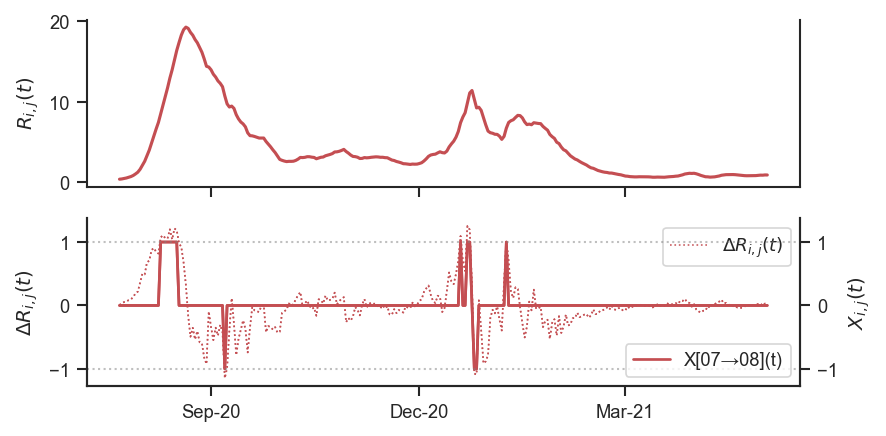

In [131]:
# i = '28'; j = '19'

lw = 1.5
lw_dt = 0.8
fig, axes = plt.subplots(2, 1, figsize=(6, 3), sharex=True, dpi=150)

ax = axes[0]
ax.plot(risk_ij_da.loc[i, j, TE_dates].to_pandas(), label=rf"$R[{i}→{j}](t)$", lw=lw, c='r')
ax.set_ylabel(r"$R_{i,j}(t)$")

ax = axes[1]
ax.plot(dt_risk_ij_da.loc[i, j, TE_dates].to_pandas(), c='r', lw=lw_dt, alpha=0.9, linestyle='dotted', label=r"$\Delta R_{i,j}(t)$")
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, lw=1.3, c='r')
ax.set_ylabel(r"$\Delta R_{i,j}(t)$")
ax.legend(loc=1)
ax = ax.twinx()
ax.plot(dt_risk_ij_da.loc[i, j, TE_dates].to_pandas(), c='r', lw=lw_dt, alpha=0.9, linestyle='dotted')
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, lw=1.3, c='r', label=rf"X[{i}→{j}](t)")
ax.set_ylabel(r"$X_{i,j}(t)$")
ax.legend(loc=4)

ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y')) 
sns.despine(right=False)
fig.tight_layout()

# fig_name = os.path.join(fig_folder, f"Risk_X_ij_{i_name}_{j_name}_q_{float(q):.2f}_delta_{delta}.png")
# fig.savefig(fig_name)

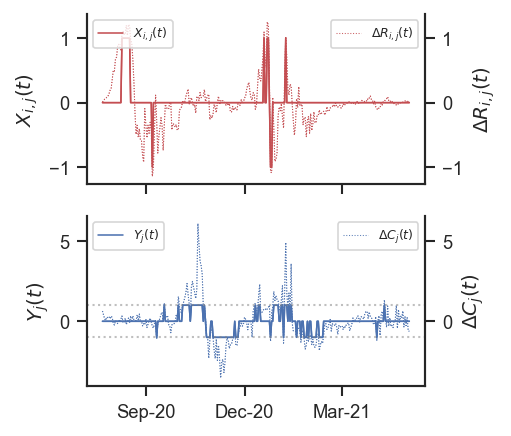

In [9]:
fig, axes = plt.subplots(2, 1, figsize=(3.5,3), sharex=True, dpi=150)

ax = axes[0]
ax.plot(dt_risk_ij_da.loc[i, j, TE_dates].to_pandas(), c='r', lw=0.5, alpha=0.9, linestyle='dotted', label=r"$\Delta R_{i,j}(t)$")
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, lw=0.7, c='r')
ax.set_ylabel(r"$X_{i,j}(t)$")
ax.legend(loc=1, fontsize=6)
ax = ax.twinx()
ax.plot(dt_risk_ij_da.loc[i, j, TE_dates].to_pandas(), c='r', lw=0.5, alpha=0.9, linestyle='dotted')
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, lw=0.75, c='r', label=r"$X_{i,j}(t)$")
ax.set_ylabel(r"$\Delta R_{i,j}(t)$")
ax.legend(loc=2, fontsize=6)

ax = axes[1]
ax.plot(dt_cases_by_100k_da.loc[j, TE_dates].to_pandas(), c='b', lw=0.5, alpha=0.9, linestyle='dotted', label=r"$\Delta C_{j}(t)$")
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, lw=0.75, c='b')
ax.set_ylabel(r"$Y_j(t)$")
ax.legend(loc=1, fontsize=6)
ax = ax.twinx()
ax.plot(dt_cases_by_100k_da.loc[j, TE_dates].to_pandas(), c='b', lw=0.5, alpha=0.9, linestyle='dotted')
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, lw=0.75, c='b', label=r"$Y_j(t)$")
ax.set_ylabel(r"$\Delta C_{j}(t)$")
ax.legend(loc=2, fontsize=6)

ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y')) 

sns.despine(right=False)
fig.tight_layout()

fig_name = os.path.join(fig_folder, f"X_ij_Y_i_{i_name}_{j_name}_q_{float(q):.2f}_delta_{delta}.png")
fig.savefig(fig_name)

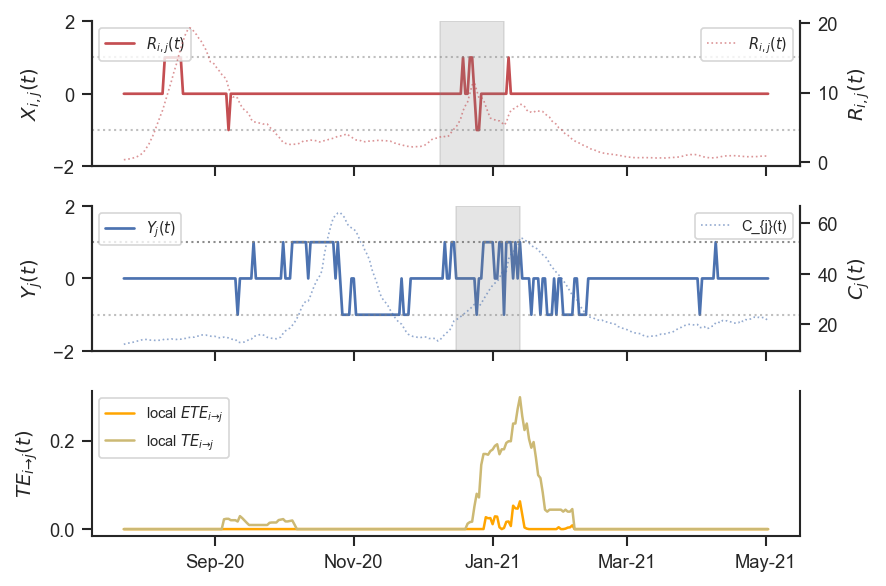

In [132]:
fig, axes = plt.subplots(3, 1, figsize=(6,4), sharex=True, dpi=150)
ax = axes[0]

ax.set_ylabel(r"$X_{i,j}(t)$")
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, label=r"$R_{i,j}(t)$", lw=1.3, c='r')
ax.set_ylim([-2, 2])
ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5)
ax.legend(loc=2, ncol=2, fancybox=True, fontsize=7)
ax = ax.twinx()
ax.plot(risk_ij_da.loc[i, j, TE_dates].to_pandas(), label=r"$R_{i,j}(t)$",  c='r', lw=0.8, alpha=0.6, linestyle='dotted')
ax.set_ylabel(r"$R_{i,j}(t)$")
ax.legend(loc=0, fancybox=True, fontsize=7)
idx = 140
start = TE_dates[idx]
end = TE_dates[idx+omega+1]

start_peak = TE_dates[argmax_idx-omega-delta]
end_peak = TE_dates[argmax_idx-delta]
ax.axvspan(start_peak, end_peak, color='grey', alpha=0.2)


ax = axes[1]
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, label=r"$Y_{j}(t)$", lw=1.3, c='b')
ax.set_ylabel(r"$Y_{j}(t)$")
ax.legend(loc=2, ncol=1, fancybox=True, fontsize=7)
ax.set_ylim([-2, 2])
ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.9) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5)
ax = ax.twinx()
ax.plot(cases_by_100k_da.loc[j, TE_dates].to_pandas(), label=r"C_{j}(t)", c='b', lw=0.8, alpha=0.6, linestyle='dotted')
ax.set_ylabel(r"$C_{j}(t)$")
ax.legend(loc=1, fancybox=True, fontsize=7)

start_peak = TE_dates[argmax_idx-omega]
end_peak = TE_dates[argmax_idx]
ax.axvspan(start_peak, end_peak, color='grey', alpha=0.2)

q = 0.95
TE_ds = load_dataset(q)
ax = axes[2]
var = "ETE_dynamic"
ax.plot(TE_ds[var].loc[i, j, TE_dates].to_pandas(), label=r"local $ETE_{i→j}$", c='orange')
var = "TE_dynamic"
ax.plot(TE_ds[var].loc[i, j, TE_dates].to_pandas(), label=r"local $TE_{i→j}$", c='y')

ax.set_ylabel(r"$TE_{i→j}(t)$")
ax.legend(loc=2, ncol=1, fancybox=True, fontsize=7)


ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y')) 

sns.despine(top=True, right=False)
fig.tight_layout()

fig_name = os.path.join(fig_folder, f"X_ij_Y_i_{i_name}_{j_name}_q_{float(q):.2f}_delta_{delta}_TE.png")
fig.savefig(fig_name)

### Ranks of total incomming and outgoing $TE_{i \rightarrow j}(t)$

In [97]:
for i in [0, 1]:
    data = TE_ds["TE_global"].values
    data[data<0] = 0
    TE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)
    TE_global = TE_global.sum(axis=i)
    data = (data-data.T)
    data[data<0] = 0
    netDI_global = pd.DataFrame(data=data, columns=pro_names, index=pro_names)
    netDI_global = netDI_global.sum(axis=i)
    
    
    data = TE_ds["ETE_global"].values
    data[data<0] = 0
    ETE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)
    ETE_global = ETE_global.sum(axis=i)
    data = (data-data.T)
    data[data<0] = 0
    netEDI_global = pd.DataFrame(data=data, columns=pro_names, index=pro_names)
    netEDI_global = netEDI_global.sum(axis=i)
    if i == 0:
        df_rank_in = pd.concat([TE_global, netDI_global, ETE_global, netEDI_global], axis=1)
        df_rank_in = df_rank_in.rename({0:"Total TE", 1:"Total DI+", 2:"Total ETE", 3:"Total EDI+"}, axis=1)
    else:
        df_rank_out = pd.concat([TE_global, netDI_global, ETE_global, netEDI_global], axis=1)
        df_rank_out = df_rank_out.rename({0:"Total TE", 1:"Total DI+", 2:"Total ETE", 3:"Total EDI+"}, axis=1)


csv_name = os.path.join(tab_folder, f"Rank_in_TE_q_{float(q):.2f}_delta_{delta}.csv")
var = "Total TE"
df_rank_in = df_rank_in.sort_values(ascending=False, by=var)
df_rank_in.to_csv(csv_name)

csv_name = os.path.join(tab_folder, f"Rank_out_TE_q_{float(q):.2f}_delta_{delta}.csv")
var = "Total TE"
df_rank_out = df_rank_out.sort_values(ascending=False, by=var)
df_rank_out.to_csv(csv_name)


var = "Total TE"
print(f"Top total outgoing {var}")
display(df_rank_out.sort_values(ascending=False, by=var).head(5))

var = "Total ETE"
print(f"Top total outgoing {var}")
display(df_rank_out.sort_values(ascending=False, by=var).head(5))

print("###################################")

var = "Total TE"
print(f"Top total incomming {var}")
display(df_rank_in.sort_values(ascending=False, by=var).head(5))

var = "Total ETE"
print(f"Top total incomming {var}")
display(df_rank_in.sort_values(ascending=False, by=var).head(5))

Top total outgoing Total TE


,Total TE,Total DI+,Total ETE,Total EDI+
Madrid,0.670601,0.186517,0.286622,0.096563
Granada,0.420906,0.233281,0.317730,0.226027
Valladolid,0.408541,0.110479,0.233202,0.087025
València/Valencia,0.378378,0.118087,0.197917,0.082743
Sevilla,0.369232,0.122906,0.272276,0.126121


Top total outgoing Total ETE


,Total TE,Total DI+,Total ETE,Total EDI+
Granada,0.420906,0.233281,0.317730,0.226027
Madrid,0.670601,0.186517,0.286622,0.096563
Sevilla,0.369232,0.122906,0.272276,0.126121
Valladolid,0.408541,0.110479,0.233202,0.087025
Burgos,0.332558,0.154359,0.201658,0.144219


###################################
Top total incomming Total TE


,Total TE,Total DI+,Total ETE,Total EDI+
Madrid,0.692009,0.207925,0.387362,0.197304
Valladolid,0.359704,0.061642,0.217648,0.071470
Málaga,0.355795,0.228838,0.274337,0.226587
València/Valencia,0.317340,0.057048,0.180735,0.065561
Barcelona,0.306905,0.132234,0.156665,0.094169


Top total incomming Total ETE


,Total TE,Total DI+,Total ETE,Total EDI+
Madrid,0.692009,0.207925,0.387362,0.197304
Málaga,0.355795,0.228838,0.274337,0.226587
Lugo,0.296047,0.213820,0.232618,0.198730
Valladolid,0.359704,0.061642,0.217648,0.071470
Cáceres,0.293402,0.136441,0.206105,0.113241


In [114]:
from scipy.stats import spearmanr, kendalltau

df = df_rank_out.reset_index()
x = df['Total TE'].sort_values().index
y = df['Total DI+'].sort_values().index

print("kendalltau", kendalltau(x, y))
print("spearmanr", spearmanr(df['Total TE'], df['Total DI+']))

print()
df = df_rank_in.reset_index()
x = df['Total TE'].sort_values().index
y = df['Total DI+'].sort_values().index

print("kendalltau", kendalltau(x, y))
print("spearmanr", spearmanr(df['Total TE'], df['Total DI+']))

kendalltau SignificanceResult(statistic=0.6310204081632653, pvalue=1.006077486614101e-10)
spearmanr SignificanceResult(statistic=0.8209181954751624, pvalue=2.889703792377702e-13)

kendalltau SignificanceResult(statistic=0.5248979591836734, pvalue=7.506580497413938e-08)
spearmanr SignificanceResult(statistic=0.7049160807328154, pvalue=1.101745822896647e-08)


In [ ]:


# print(f"Top total outgoing {var}")
# display(df_rank_out.sort_values(ascending=False, by=var).head())
print("##############################################")

var = "Total TE"
print(f"Top total outgoing {var}")
display(df_rank_out.sort_values(ascending=False, by=var).head(7))

var = "Total ETE"
print(f"Top total outgoing {var}")
display(df_rank_out.sort_values(ascending=False, by=var).head(7))
tables_folder = 
tab_folder = "../outputs/TE_cnig_provincias/tables"
csv_name = os.path.join(tables_folder, f"Rank_in_{var}_q_{float(q):.2f}_delta_{delta}")

# var = "Total DI+"
# print(f"Top total incomming {var}")
# display(df_rank_in.sort_values(ascending=False, by=var).head())
# print()
# print(f"Top total outgoing {var}")
# display(df_rank_out.sort_values(ascending=False, by=var).head())

### Analyzing the effect of $\delta$

In the following cells we studied the effect of $\delta$ in the TE calculatoion

../outputs/TE_cnig_provincias/figures/TE_q_1.00_delta_5_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_1.00_delta_5_heatmap.png
../outputs/TE_cnig_provincias/figures/netDI_q_1_delta_5_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_1.00_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_1.00_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/netDI_q_1_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_1.00_delta_14_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_1.00_delta_14_heatmap.png
../outputs/TE_cnig_provincias/figures/netDI_q_1_delta_14_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_1.00_delta_21_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_1.00_delta_21_heatmap.png
../outputs/TE_cnig_provincias/figures/netDI_q_1_delta_21_heatmap.png
../outputs/TE_cnig_provincias/figures/ETE_q_1.00_delta_5_heatmap.png
../outputs/TE_cnig_provincias/figures/EDI_q_1.00_delta_5_heatmap.png
../outputs/TE_cnig_provincias/figures/ne

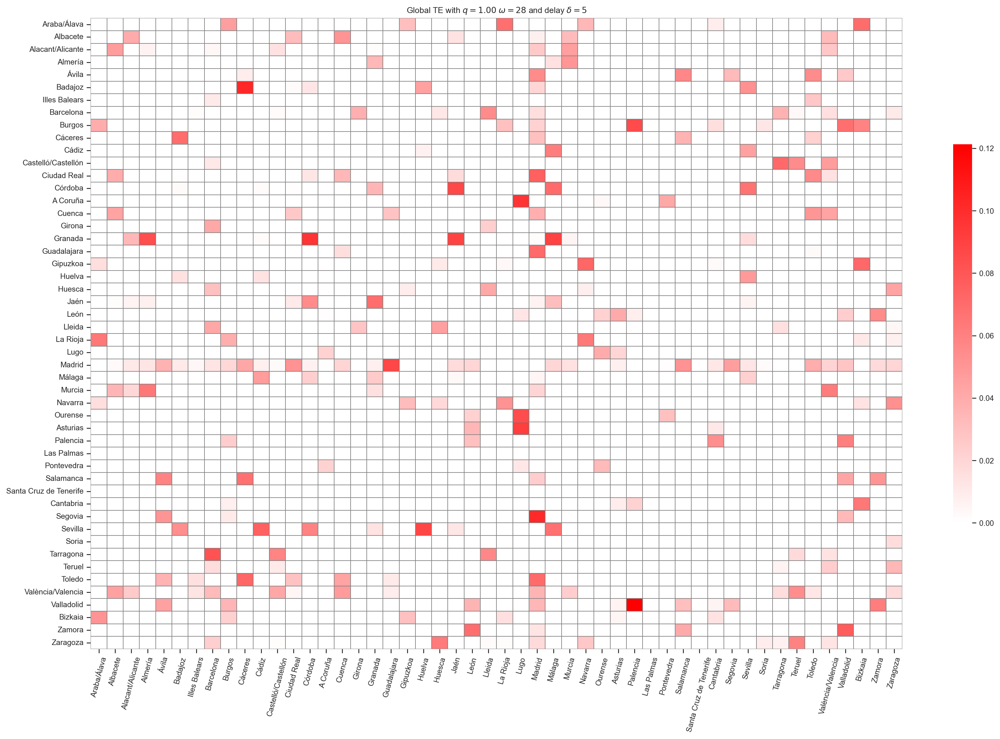

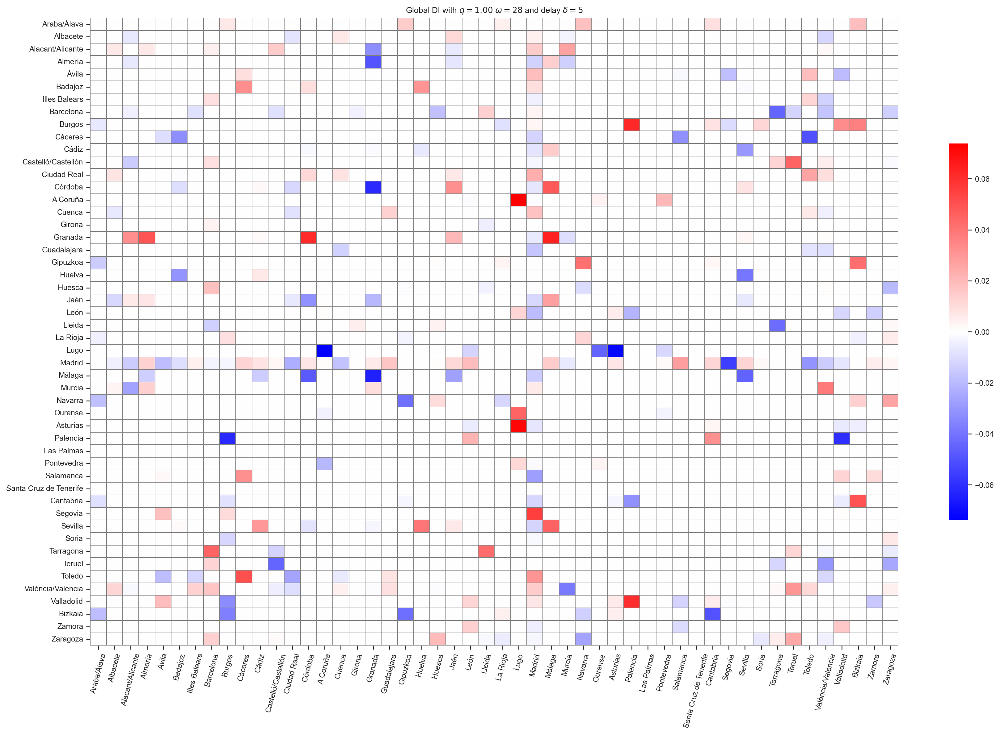

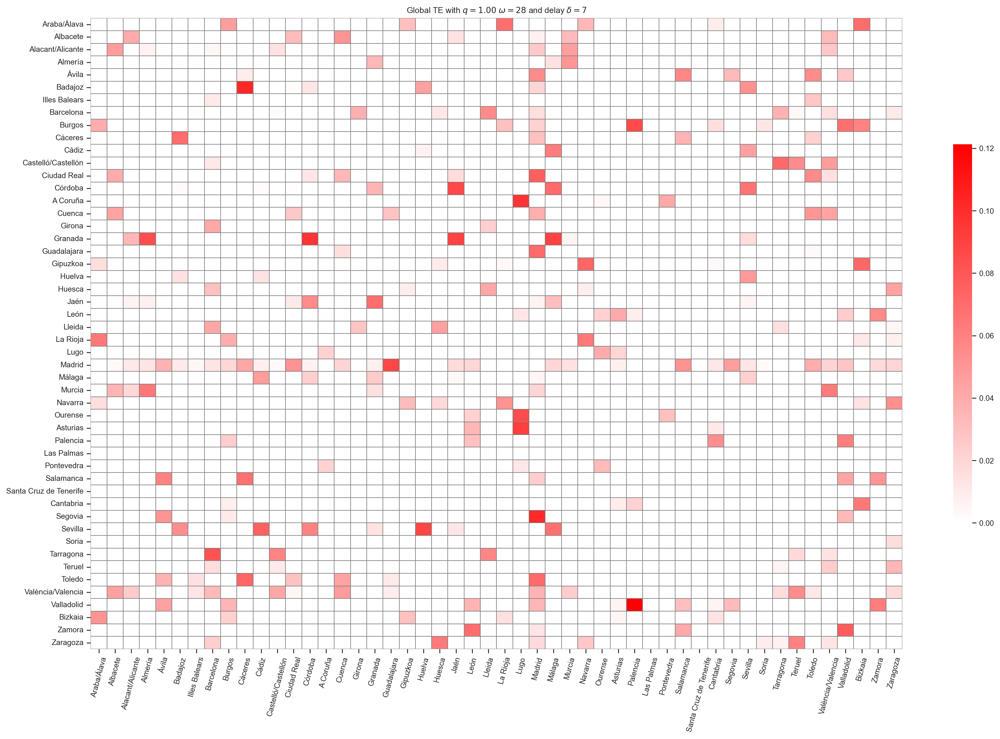

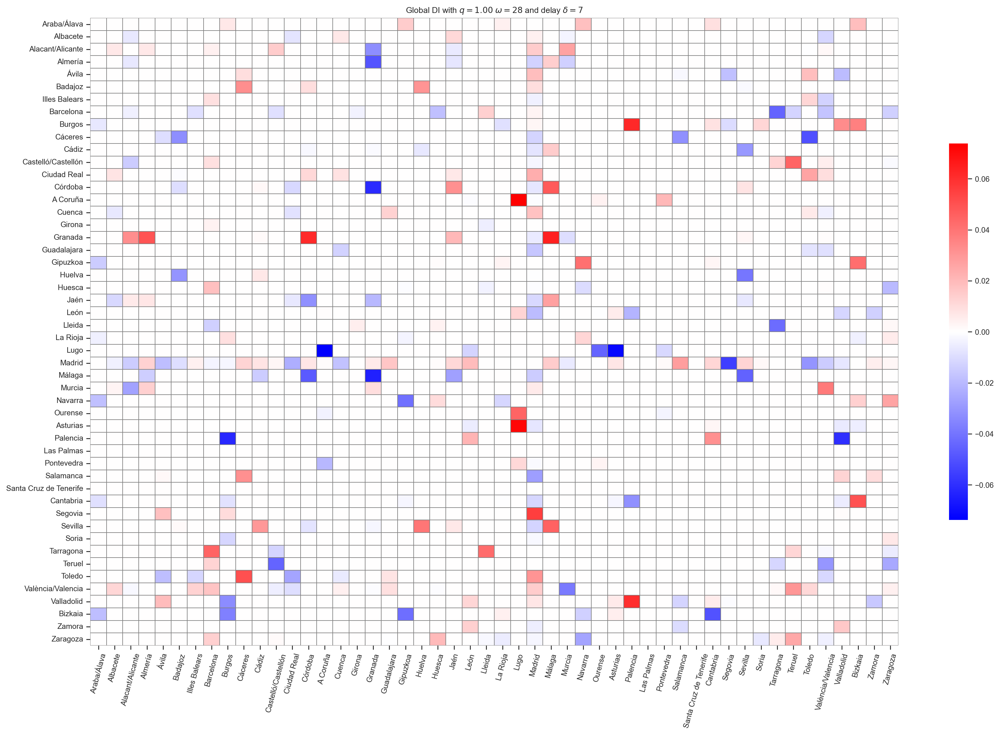

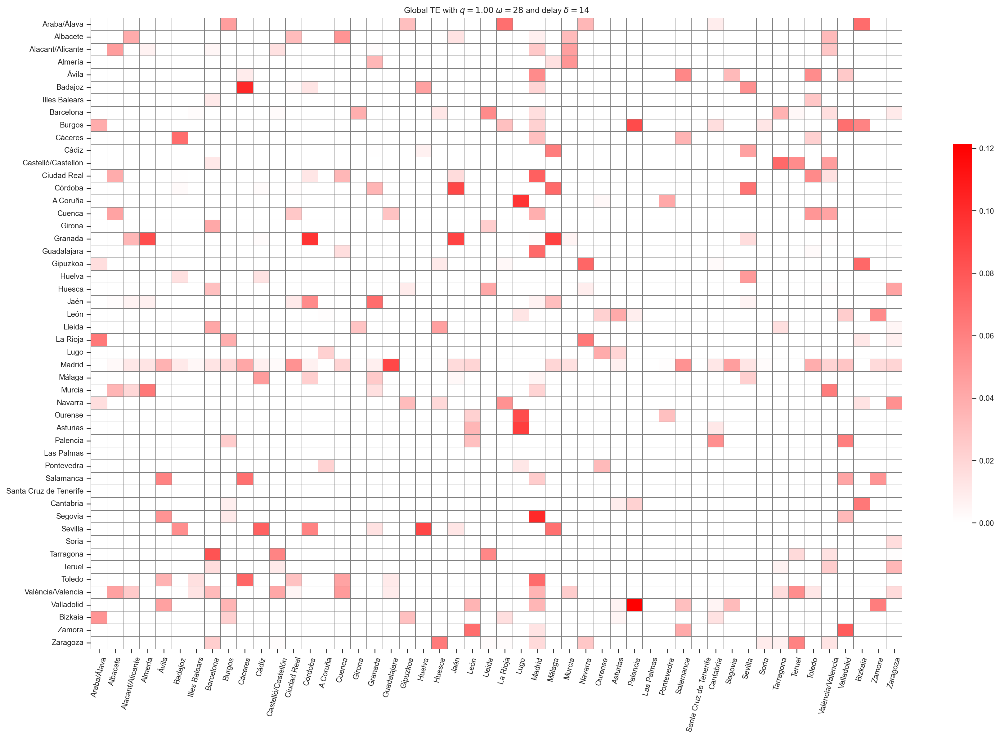

...

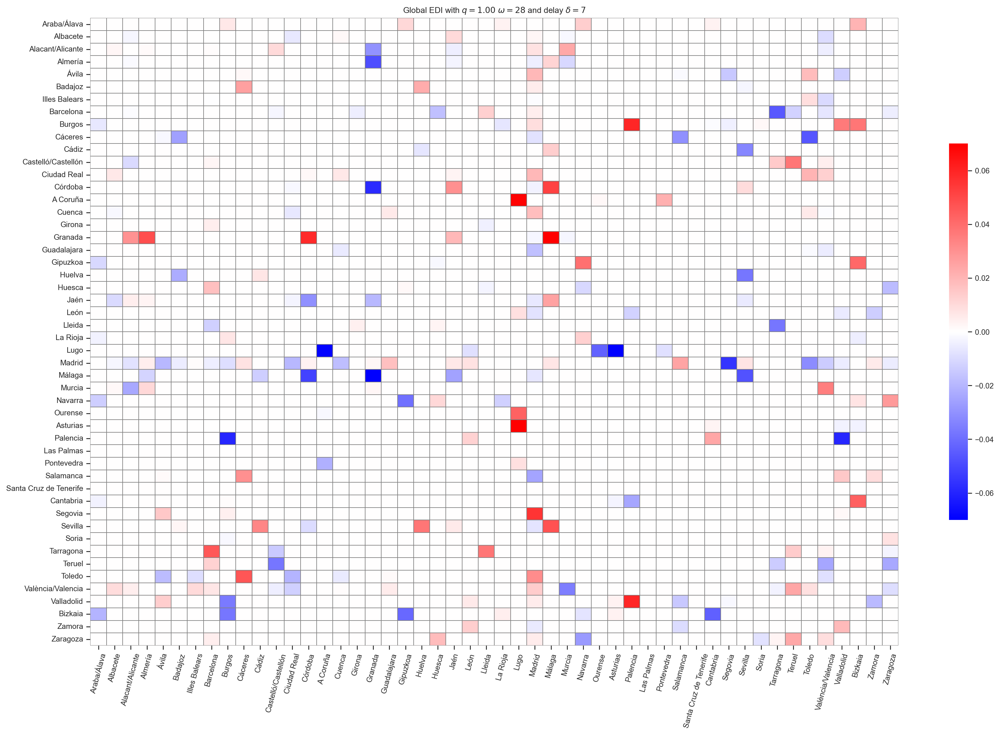

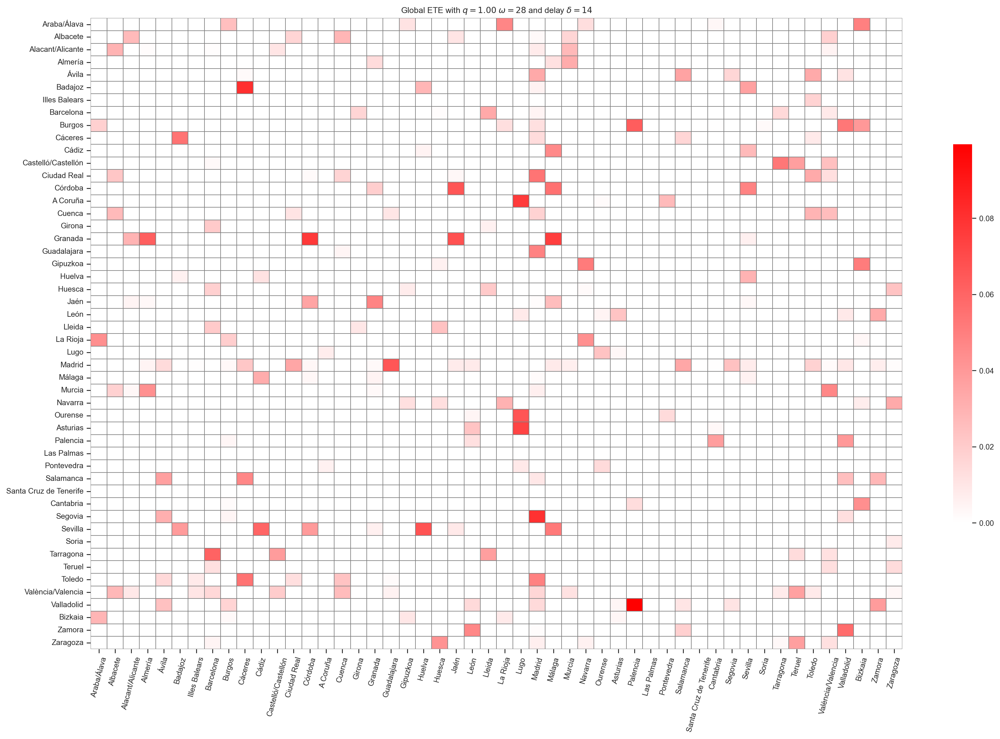

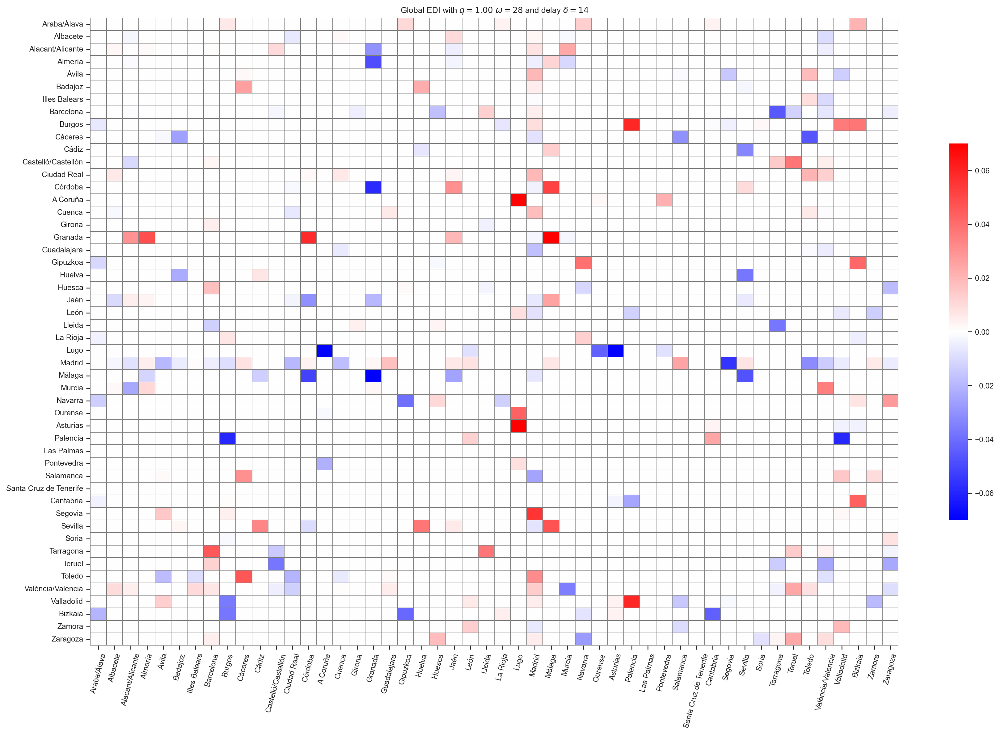

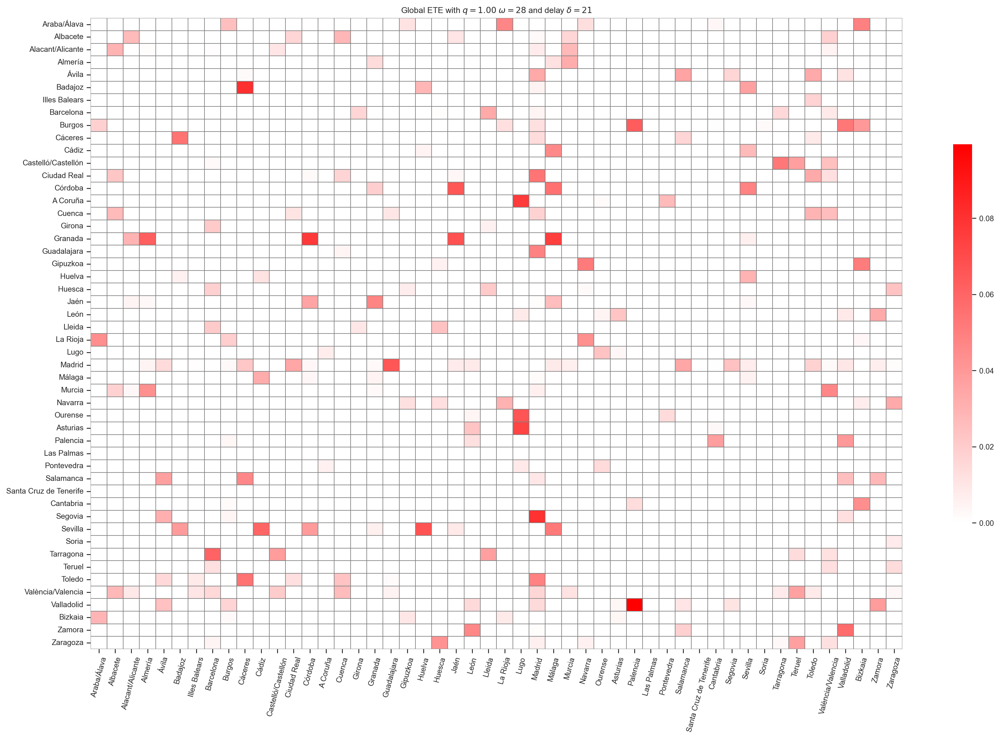

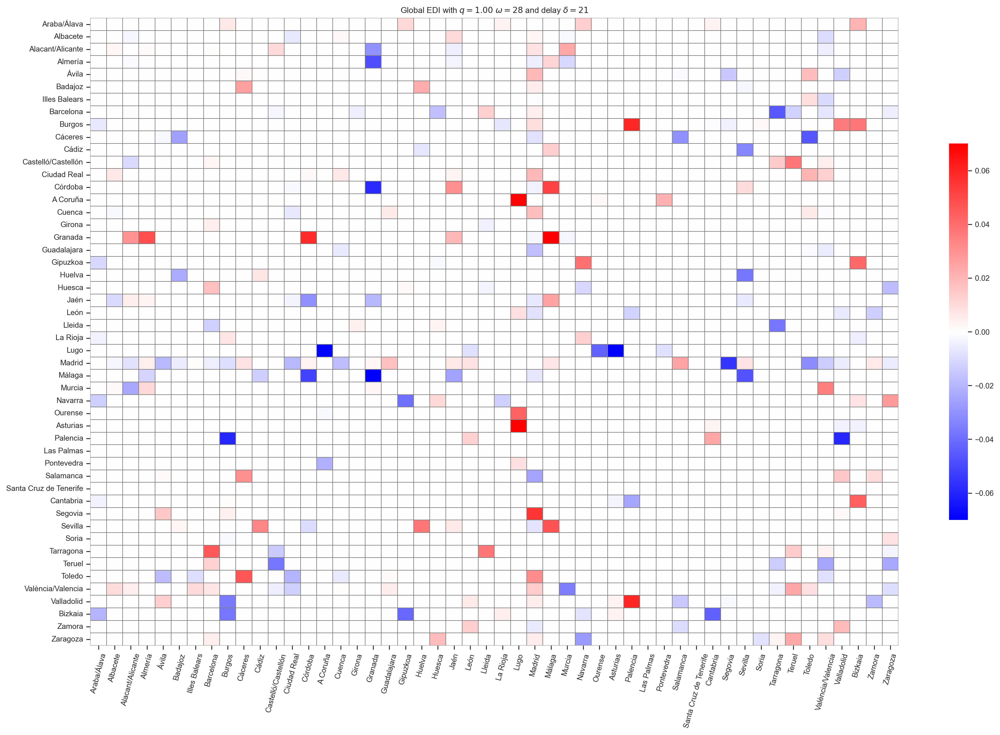

In [21]:
q = 1
omega = 28

data = []
for delta in range(5,22):
    experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
    exp_folder = f"../outputs/TE_cnig_provincias/{experiment}/"
    results_fname = os.path.join(exp_folder, "TE.nc")
    if not os.path.exists(results_fname):
        continue
    TE_ds = xr.load_dataset(results_fname)
    max_te = float(TE_ds['TE_global'].max().values)
    tot_te = float(TE_ds['TE_global'].sum().values)
    mean_te = float(TE_ds['TE_global'].mean().values)
    
    max_ete = float(TE_ds['ETE_global'].max().values)
    tot_ete = float(TE_ds['ETE_global'].sum().values)
    mean_ete = float(TE_ds['ETE_global'].mean().values)
    data.append([delta, tot_te, max_te, mean_te, tot_ete, max_ete, mean_ete])

columns = ["Delta", "Total TE", "Max TE", "Mean TE", "Total ETE", "Max ETE", "Mean ETE"]
df_delta_sweep = pd.DataFrame(data=data, columns=columns).set_index("Delta")

tab_fname = os.path.join(tab_folder, f"Supp_Table_sweep_delta_q{q}.tsv")
df_delta_sweep.to_csv(tab_fname, sep="\t")


white_red_cmap = LinearSegmentedColormap.from_list("white_red", ["white", "red"])
for var in ["TE", "ETE"]:
    for delta in [5, 7, 14, 21]:
        TE_ds = load_dataset(q)
        data = TE_ds[var+"_global"].values
        data[data<0] = 0
        TE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)
        
        fig_name = os.path.join(fig_folder, f"{var}_q_{float(q):.2f}_delta_{delta}_heatmap.png")
        print(fig_name)
        fig = heatmap_global_TE(TE_global, cmap=white_red_cmap, title=rf'Global {var} with $q={q:.2f}$ $\omega={omega}$ and delay $\delta={delta}$')
        fig.savefig(fig_name)
        
        label = "DI"
        if var == "ETE":
            label = "EDI"
        
        DI_global = pd.DataFrame(data=(data-data.T), columns=pro_names, index=pro_names)
        fig_name = os.path.join(fig_folder, f"{label}_q_{float(q):.2f}_delta_{delta}_heatmap.png")
        print(fig_name)
        fig = heatmap_global_TE(DI_global, cmap='bwr', title=rf'Global {label} with $q={q:.2f}$ $\omega={omega}$ and delay $\delta={delta}$')
        fig.savefig(fig_name)

        label = "netDI"
        if var == "ETE":
            label = "netEDI"

        data = (data-data.T)
        data[data<0] = 0
        netDI_global = pd.DataFrame(data=data, columns=pro_names, index=pro_names)
        fig_name = os.path.join(fig_folder, f"{label}_q_{q}_delta_{delta}_heatmap.png")
        print(fig_name)
        fig = heatmap_global_TE(netDI_global, cmap=white_red_cmap, title=rf'Global {label} with $q={q:.2f}$ $\omega={omega}$ and delay $\delta={delta}$')
        fig.savefig(fig_name)
        plt.close()


### Analyzing the effect of $q$

In the following cells we studied the effect of q in the TE calculatoion

In [19]:
delta = 7
omega = 28
data = []
for q in [0.1, 0.5, 0.75, 0.9, 0.95, 1, 1.05, 1.1]:
    TE_ds = load_dataset(q)
    tot_te = float(TE_ds['TE_global'].sum().values)
    max_te = float(TE_ds['TE_global'].max().values)
    mean_te = float(TE_ds['TE_global'].mean().values)
    tot_ete = float(TE_ds['ETE_global'].sum().values)
    max_ete = float(TE_ds['ETE_global'].max().values)
    mean_ete = float(TE_ds['ETE_global'].mean().values)
    data.append([q, tot_te, max_te, mean_te, tot_ete, max_ete, mean_ete])


columns = ["q", "Total TE", "Max TE", "Mean TE", "Total ETE", "Max ETE", "Mean ETE"]
df_q_sweep = pd.DataFrame(data=data, columns=columns).set_index("q")

tab_fname = os.path.join(tab_folder, f"Supp_Table_sweep_q_delta{delta}.tsv")
df_delta_sweep.to_csv(tab_fname, sep="\t")

white_red_cmap = LinearSegmentedColormap.from_list("white_red", ["white", "red"])
for var in ["TE", "ETE"]:
    for q in [0.1, 0.5, 0.75, 0.9, 0.95, 1, 1.05, 1.1]:
        TE_ds = load_dataset(q)
        data = TE_ds[var+"_global"].values
        data[data<0] = 0
        TE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)
        
        fig_name = os.path.join(fig_folder, f"{var}_q_{float(q):.2f}_delta_{delta}_heatmap.png")
        print(fig_name)
        fig = heatmap_global_TE(TE_global, cmap=white_red_cmap, title=rf'Global {var} with $q={q:.2f}$ $\omega={omega}$ and delay $\delta={delta}$')
        fig.savefig(fig_name)
        
        label = "DI"
        if var == "ETE":
            label = "EDI"
        
        DI_global = pd.DataFrame(data=(data-data.T), columns=pro_names, index=pro_names)
        fig_name = os.path.join(fig_folder, f"{label}_q_{float(q):.2f}_delta_{delta}_heatmap.png")
        print(fig_name)
        fig = heatmap_global_TE(DI_global, cmap='bwr', title=rf'Global {label} with $q={q:.2f}$ $\omega={omega}$ and delay $\delta={delta}$')
        fig.savefig(fig_name)

        label = "netDI"
        if var == "ETE":
            label = "netEDI"

        data = (data-data.T)
        data[data<0] = 0
        netDI_global = pd.DataFrame(data=data, columns=pro_names, index=pro_names)
        fig_name = os.path.join(fig_folder, f"{label}_q_{float(q):.2f}_delta_{delta}_heatmap.png")
        print(fig_name)
        fig = heatmap_global_TE(netDI_global, cmap=white_red_cmap, title=rf'Global {label} with $q={q:.2f}$ $\omega={omega}$ and delay $\delta={delta}$')
        fig.savefig(fig_name)
        plt.close()


### Relation Between $TE_{i \rightarrow j}$ and distance

PearsonRResult(statistic=-0.49360165764500535, pvalue=3.3805146662638946e-20)
PearsonRResult(statistic=-0.4822088683687537, pvalue=3.1774303270455834e-19)


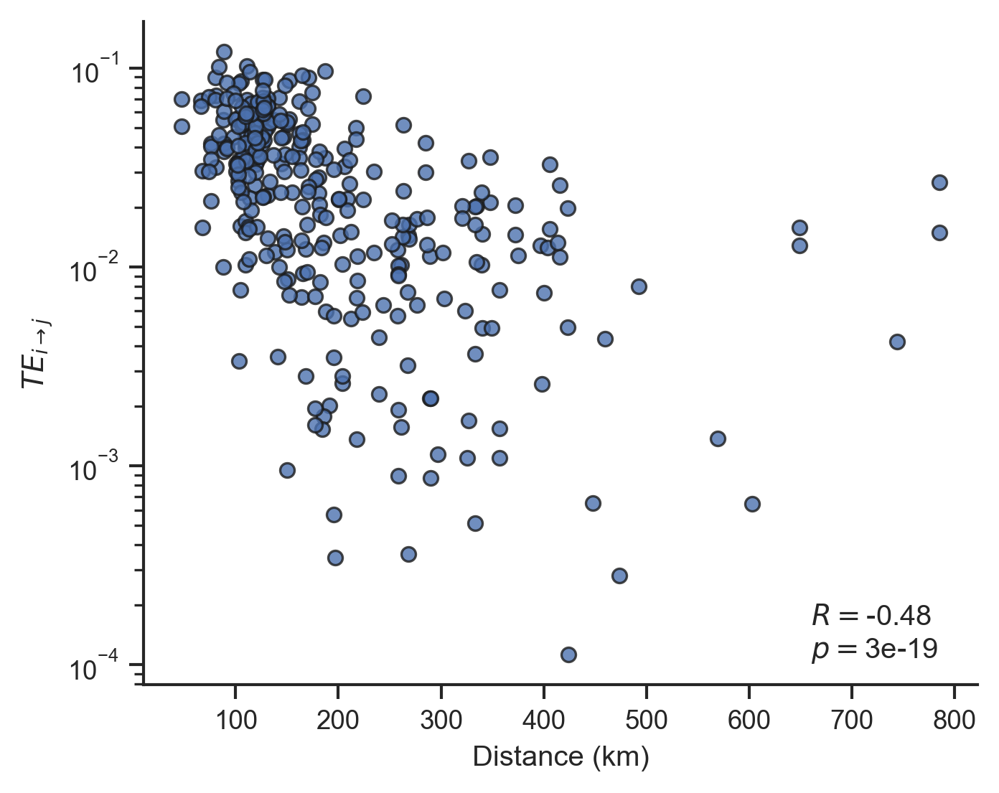

In [91]:
N = len(pro_names)
data = np.zeros((N, N))
for i,m in enumerate(gdf.index):
    for j,n in enumerate(gdf.index):
        if i==j:
            data[i,j] = 0
            continue
        p1 = gdf.loc[m, 'centroid']
        p2 = gdf.loc[n, 'centroid']
        lat1, lon1 = (p1.coords.xy[0][0], p1.coords.xy[1][0])
        lat2, lon2 = (p2.coords.xy[0][0], p2.coords.xy[1][0])
        data[i,j] = hs.haversine((lat1, lon1), (lat2, lon2))

distnace_df = pd.DataFrame(data=data, index=pro_names, columns=pro_names)

q = 1
delta = 7
TE_ds = load_dataset(q)
data = TE_ds["TE_global"].values
data[data<0] = 0
TE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)

x = distnace_df.values.reshape(2500)
y = TE_global.values.reshape(2500)

mask = y>1e-6
x = x[mask]
y = y[mask]

fig, ax = plt.subplots(1, 1, figsize=(5,4), dpi=300)
ax.scatter(x, y, edgecolors='k', alpha=0.8)

ax.set_yscale('log')
ax.set_xlabel('Distance (km)')
ax.set_ylabel(r'$TE_{i \rightarrow j}$')
sns.despine()

r, p = pearsonr(x, y)
ax.text(.8, .09, rf'$R=${r:.2f}', transform=ax.transAxes)
ax.text(.8, .04, rf'$p=${p:.0e}', transform=ax.transAxes)

fig_name = os.path.join(fig_folder, f"TEij_vs_distance_q{q}_delta_{delta}.png")
fig.savefig(fig_name)

print(pearsonr(x, np.log(y)))
print(pearsonr(x, y))

0.03405441498576442


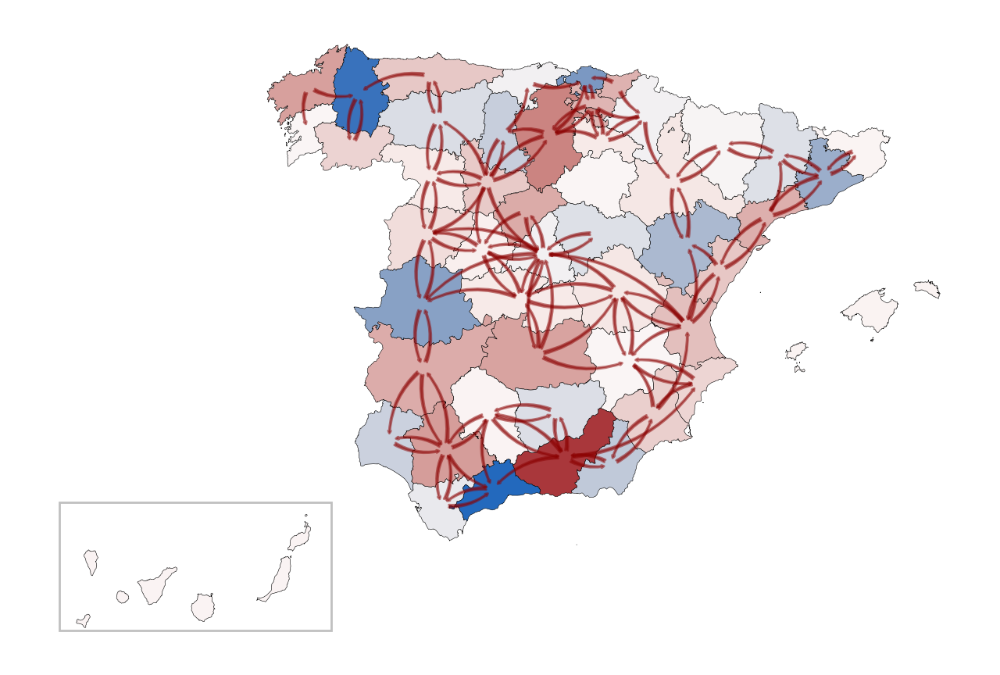

In [121]:
q = 1
TE_ds = load_dataset(q)
var = "TE_global"

data = TE_ds[var].values
data = (data-data.T)
netEDI_global = pd.DataFrame(data=data, columns=pro_names, index=pro_names)
netEDI_global = netEDI_global.sum(axis=1)
netEDI_global.name = "Net DI"
node_var = "Net DI"

gdf_aux = pd.merge(gdf, netEDI_global, left_on='name', right_index=True)

fig, ax = plt.subplots(1, 1, figsize=(8,8), dpi=200)
ax.add_patch(Rectangle((-13.5,34.6), 5.5, 2., edgecolor='silver', facecolor='none', lw=1))

cmap = sns.color_palette("vlag", as_cmap=True)
norm = mpl.colors.Normalize(vmin=gdf_aux[node_var].min(), vmax=gdf_aux[node_var].max())

gdf_aux.plot(edgecolor='black', linewidth=0.2, column=node_var, cmap=cmap, ax=ax, norm=norm)

ax.set_axis_off()
ax.set_facecolor('white')


df_global_TE = TE_ds[var].to_dataframe()

max_te = TE_ds[var].to_pandas().max(axis=1).values
thr_quantile = 0.1
thr = np.quantile(max_te, thr_quantile)

df_global_TE = df_global_TE[df_global_TE[var] > thr]

G = nx.DiGraph()
G.add_weighted_edges_from(df_global_TE.reset_index().values)

coord_dict = {k:(v.x, v.y) for k,v in gdf['centroid'].to_dict().items()}
nodes = nx.draw_networkx_nodes(G, coord_dict, node_size=0, node_color="white", ax=ax)
edges = nx.draw_networkx_edges(G, coord_dict, arrowstyle='fancy', connectionstyle="arc3,rad=0.24", 
                           arrowsize=3, node_size=40, edge_color="darkred", alpha=0.5, ax=ax)
nodes.set_edgecolor('grey')

print(thr)

array([0.02091282, 0.03405441, 0.04864877, 0.06366758, 0.07681445,
       0.09219783, 0.09945803])

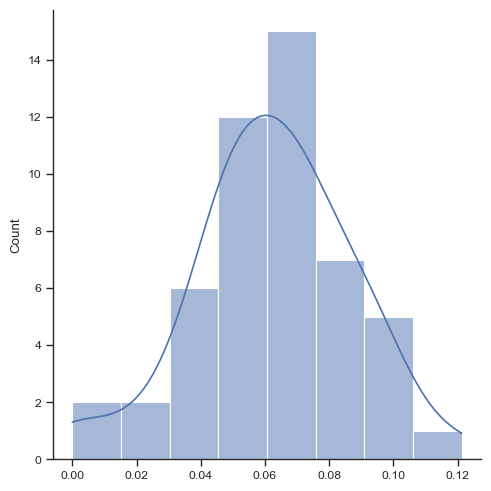

In [128]:
s = TE_ds[var].to_pandas().max(axis=1)
sns.displot(s, kde=True)
np.quantile(s, [0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95])

R=0.62   p-value=2.13e-38


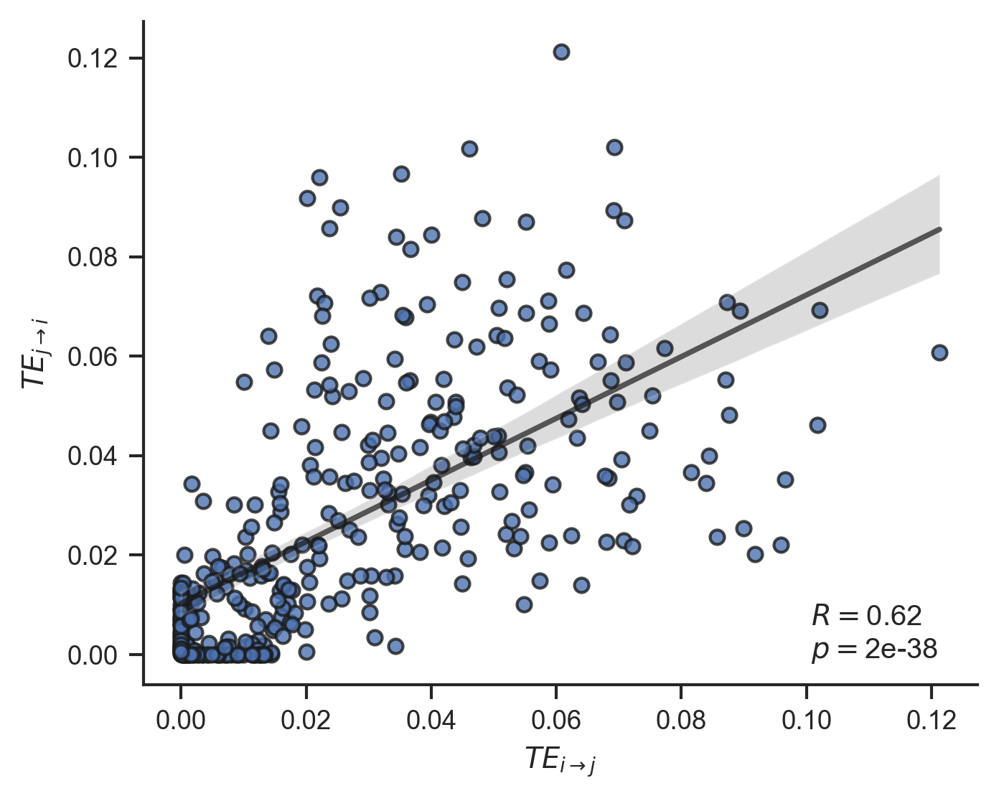

In [88]:
thr = 1e-5
q = 1
delta = 7
var="TE_global"
TE_ds = load_dataset(q)
TE_global = TE_ds[var]

data = []
for i in df_pro.index:
    for j in df_pro.index:
        if i==j:
            continue
        ij = float(TE_global.loc[i,j])
        ji = float(TE_global.loc[j,i])
        if ij < thr and ji < thr :
            continue
        data.append([ij, ji])

from scipy.stats import pearsonr

fig, ax = plt.subplots(1, 1, figsize=(5,4), dpi=300)
df = pd.DataFrame(data, columns=["TE(i->j)", "TE(j->i)"])
sns.regplot(data=df, x="TE(i->j)", y="TE(j->i)", ax=ax, 
           scatter_kws={"edgecolor": "k"}, line_kws={"color": "k", "alpha": 0.7})

ax.set_xlabel(r"$TE_{i \rightarrow j}$")
ax.set_ylabel(r"$TE_{j \rightarrow i}$")
sns.despine()
# call the scipy function for pearson correlation
r, p = pearsonr(df["TE(i->j)"], df["TE(j->i)"])
print(f"R={r:.2f}   p-value={p:.2e}")

ax.text(.8, .09, rf'$R=${r:.2f}', transform=ax.transAxes)
ax.text(.8, .04, rf'$p=${p:.0e}', transform=ax.transAxes)

fig_name = os.path.join(fig_folder, f"TEij_vs_TEji_q{q}_delta_{delta}.png")
fig.savefig(fig_name)

### TE vs ETE

R=0.97   p-value=0.00e+00


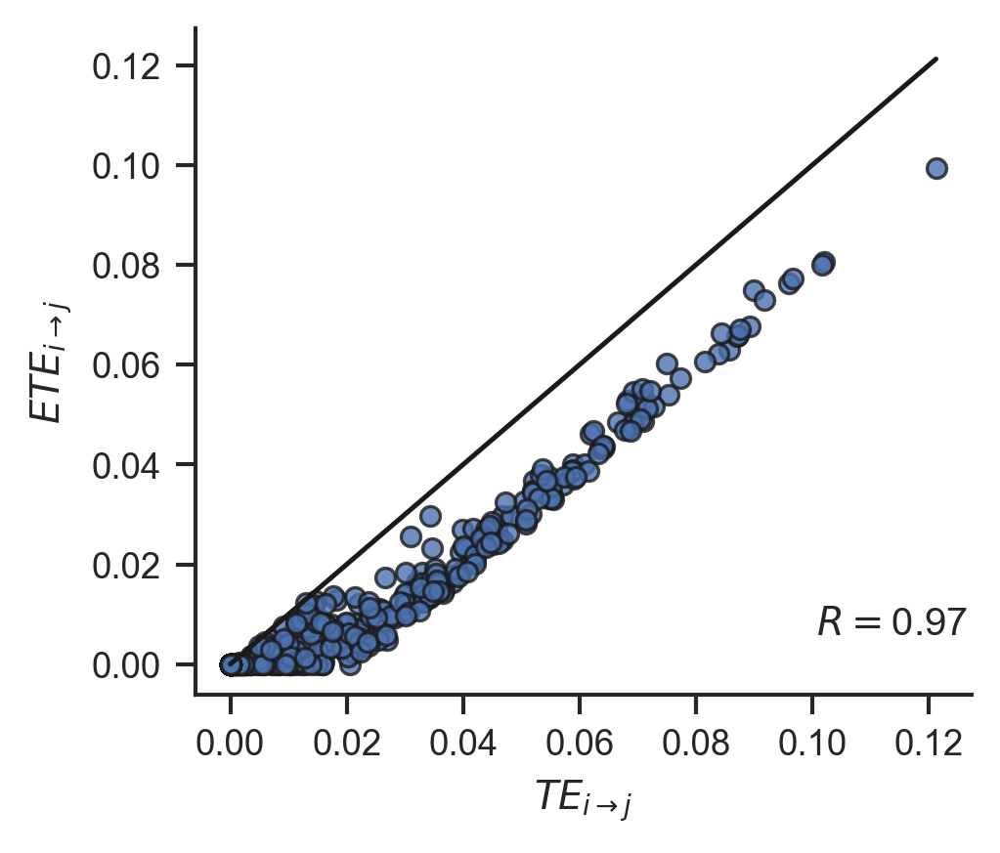

In [117]:
q = 1

TE_ds = load_dataset(q)
data = TE_ds["TE_global"].values
data[data<0] = 0
TE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)

data = TE_ds["ETE_global"].values
data[data<0] = 0
ETE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)

x = TE_global.values.reshape(2500)
y = ETE_global.values.reshape(2500)
z = np.linspace(0, x.max())

fig, ax = plt.subplots(1, 1, figsize=(3.5,3), dpi=300)
ax.plot(z, z, c='k')
ax.scatter(x,y, edgecolors='k', alpha=0.8)
ax.set_xlabel(r'$TE_{i \rightarrow j}$')
ax.set_ylabel(r'$ETE_{i \rightarrow j}$')

r, p = pearsonr(x, y)
print(f"R={r:.2f}   p-value={p:.2e}")

ax.text(.8, .09, rf'$R=${r:.2f}', transform=ax.transAxes)
# ax.text(.8, .04, rf'$p=${0}', transform=ax.transAxes)

sns.despine()
fig.tight_layout()

fig_name = os.path.join(fig_folder, f"TEij_vs_ETEij_q{q}_delta_{delta}.png")
fig.savefig(fig_name)

In [ ]:
sns.set_theme('paper')
sns.set_style("ticks")


q = 1
delta = 7
omega = 28
experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
exp_folder = f"../outputs/TE_cnig_provincias/{experiment}/"

results_fname = os.path.join(exp_folder, "TE.nc")
TE_ds = xr.load_dataset(results_fname)
TE  = TE_ds['TE_dynamic']
ETE = TE_ds['ETE_dynamic']

X_fname = os.path.join(exp_folder, "X.nc")
X_ij = xr.load_dataarray(X_fname)

Y_fname = os.path.join(exp_folder, "Y.nc")
Y_j = xr.load_dataarray(Y_fname)



thr = 0.9
use_ETE = False
top = 2
offset = 45


study_cases = [("28", "33"), ("28", "19"), ("07", "08"), ("25", "22"), ("03", "30")]
study_cases = study_cases + [(y,x) for x,y in study_cases]
study_cases = sorted(study_cases)

for x,y in study_cases:    
    TE_xy = TE.loc[x,y,:]
    TE_yx = TE.loc[y,x,:]

    ETE_xy = ETE.loc[x,y,:]
    ETE_yx = ETE.loc[y,x,:]
    
    start = omega
    TE_dates = dates[start:]
    end = min(len(TE_dates), TE_xy.shape[0])
    TE_dates = TE_dates[:end]
    
    DIxy = TE_xy - TE_yx
    DIxy[np.abs(DIxy) < thr] = 0
    
    EDIxy = ETE_xy - ETE_yx
    EDIxy[np.abs(EDIxy) < thr] = 0

    print(len(TE_dates), len(DIxy))

    if DIxy[offset:].max() < thr:
        continue

    top_k_TE_indices = np.argsort(DIxy[offset:])[-top:][::-1] + offset -1
    top_k_TE_dates = TE_dates[top_k_TE_indices]
    
    top_k_ETE_indices = np.argsort(EDIxy[offset:])[-top:][::-1] + offset 
    top_k_ETE_dates = TE_dates[top_k_ETE_indices]
    
    top_k_indices = top_k_TE_indices
    top_k_dates = top_k_TE_dates
    if use_ETE:
        top_k_indices = top_k_ETE_indices
        top_k_dates = top_k_ETE_dates
    
    
    if np.abs(top_k_indices[0] - top_k_indices[1]) < omega/2.:
        top_k_indices = top_k_indices[:1]
        top_k_dates = top_k_dates[:1]
    
    fig, axes = plt.subplots(3, 1, figsize=(10,4), sharex=True, dpi=150)
    ax = axes[0]
    ax.plot(risk_ij.loc[x, y, TE_dates].to_pandas(), label=rf"R[{x} -> {y}](t)")
    ax.plot(risk_ij.loc[y, x, TE_dates].to_pandas(), label=rf"R[{y} -> {x}](t)", c='r', alpha=0.3)
    ax.legend(loc=2)
    ax = ax.twinx()
    ax.set_yticks([-1,0,1])
    ax.plot(X_ij.loc[x, y, TE_dates].to_pandas()-1, c='grey', alpha=0.5)
    for index_date in top_k_indices:
        start = TE_dates[index_date-omega-delta]
        end = TE_dates[index_date-delta]
        ax.axvspan(start, end, color='grey', alpha=0.3)
    
    ax = axes[1]
    ax.plot(cases_by_100k.loc[x, TE_dates].to_pandas(), label=rf"C[{x}](t)", alpha=0.3)
    ax.plot(cases_by_100k.loc[y, TE_dates].to_pandas(), c='r', label=rf"C[{y}](t)")
    ax.legend(loc=2)
    ax = ax.twinx()
    ax.set_yticks([-1,0,1])
    ax.plot(Y_j.loc[y, TE_dates].to_pandas()-1, c='grey', alpha=0.5)
    for index_date in top_k_indices:
        start = TE_dates[index_date-omega]
        end = TE_dates[index_date]
        ax.axvspan(start, end, color='grey', alpha=0.3)
    
    axes[2].plot(TE_dates, DIxy, label=r"$DI_{xy}$")
    axes[2].plot(TE_dates, EDIxy, label=r"$DI^{eff}_{xy}$")
    axes[2].set_yticks([-0.6,0,0.6])
    for index_date in top_k_indices:
        axes[2].axvline(TE_dates[index_date], c='k', ls='--', lw=2, alpha=0.5)
    axes[2].legend(loc=2)
   
    sns.despine(left=False, right=False)
    plt.show()

In [ ]:
data = TE_ds["TE_global"].values
data[data<0] = 0
TE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)

data = TE_ds["ETE_global"].values
data[data<0] = 0
ETE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)

te_shuff = (TE_global - ETE_global).values.flatten()
te_shuff = te_shuff[te_shuff>0.015]

sns.displot(te_shuff)

In [ ]:
sns.set_theme('paper')
sns.set_style("ticks")


q = 1
delta = 7
omega = 28
experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
exp_folder = f"../outputs/TE_cnig_provincias/{experiment}/"

results_fname = os.path.join(exp_folder, "TE.nc")
TE_ds = xr.load_dataset(results_fname)
TE  = TE_ds['TE_dynamic']
ETE = TE_ds['ETE_dynamic']

X_fname = os.path.join(exp_folder, "X.nc")
X_ij = xr.load_dataarray(X_fname)

Y_fname = os.path.join(exp_folder, "Y.nc")
Y_j = xr.load_dataarray(Y_fname)


thr = 0.1
use_ETE = False
top = 2
offset = 45


study_cases = [("28", "33"), ("28", "19"), ("07", "08"), ("25", "22")]
study_cases = study_cases + [(y,x) for x,y in study_cases]
study_cases = sorted(study_cases)

for x,y in study_cases:    
    TE_xy = TE.loc[x,y,:]
    TE_yx = TE.loc[y,x,:]

    ETE_xy = ETE.loc[x,y,:]
    ETE_yx = ETE.loc[y,x,:]
    
    start = omega
    TE_dates = dates[start:]
    end = min(len(TE_dates), TE_xy.shape[0])
    TE_dates = TE_dates[:end]
    
    DIxy = TE_xy - TE_yx
    DIxy[np.abs(DIxy) < thr] = 0
    
    EDIxy = ETE_xy - ETE_yx
    EDIxy[np.abs(EDIxy) < thr] = 0

    print(len(TE_dates), len(DIxy))

    if DIxy[offset:].max() < thr:
        continue

    top_k_TE_indices = np.argsort(DIxy[offset:])[-top:][::-1] + offset -1
    top_k_TE_dates = TE_dates[top_k_TE_indices]
    
    top_k_ETE_indices = np.argsort(EDIxy[offset:])[-top:][::-1] + offset -1
    top_k_ETE_dates = TE_dates[top_k_ETE_indices]
    
    top_k_indices = top_k_TE_indices
    top_k_dates = top_k_TE_dates
    
    if np.abs(top_k_indices[0] - top_k_indices[1]) < omega/2.:
        top_k_indices = top_k_indices[:1]
        top_k_dates = top_k_dates[:1]
    
    fig, axes = plt.subplots(3, 1, figsize=(10,4), sharex=True, dpi=150)
    ax = axes[0]
    ax.plot(risk_ij.loc[x, y, TE_dates].to_pandas(), label=rf"R[{x} -> {y}](t)")
    ax.plot(risk_ij.loc[y, x, TE_dates].to_pandas(), label=rf"R[{y} -> {x}](t)", c='r', alpha=0.3)
    ax.legend(loc=2)
    ax = ax.twinx()
    ax.set_yticks([-1,0,1])
    ax.plot(X_ij.loc[x, y, TE_dates].to_pandas()-1, c='grey', alpha=0.5)
    for index_date in top_k_indices:
        start = TE_dates[index_date-omega-delta]
        end = TE_dates[index_date-delta]
        ax.axvspan(start, end, color='grey', alpha=0.3)
    
    ax = axes[1]
    ax.plot(cases_by_100k.loc[x, TE_dates].to_pandas(), label=rf"C[{x}](t)", alpha=0.3)
    ax.plot(cases_by_100k.loc[y, TE_dates].to_pandas(), c='r', label=rf"C[{y}](t)")
    ax.legend(loc=2)
    ax = ax.twinx()
    ax.set_yticks([-1,0,1])
    ax.plot(Y_j.loc[y, TE_dates].to_pandas()-1, c='grey', alpha=0.5)
    for index_date in top_k_indices:
        start = TE_dates[index_date-omega]
        end = TE_dates[index_date]
        ax.axvspan(start, end, color='grey', alpha=0.3)
    
    axes[2].plot(TE_dates, TE_xy, label=r"$ETE_{xy}$")
    axes[2].plot(TE_dates, -1*TE_yx, label=r"$ETE_{yx}$", c='r')
    
    axes[2].plot(TE_dates, DIxy, label=r"$DI_{xy}$", c='y')
    #axes[2].plot(TE_dates, EDIxy, label=r"$DI^{eff}_{xy}$", c='y')
    #axes[2].set_yticks([-0.6,0,0.6])

    for index_date in top_k_indices:
        axes[2].axvline(TE_dates[index_date], c='k', ls='--', lw=1.5, alpha=0.5)
    axes[2].legend(loc=2)
   
    sns.despine(left=False, right=False)
    plt.show()